In [276]:
import pandas as pd
import numpy as np

import plotly.graph_objects as go
import plotly.express as px

In [245]:
kyc_data = pd.read_csv('../data/raw/kyc.csv')
emt_data = pd.read_csv('../data/raw/emt.csv')
wire_data = pd.read_csv('../data/raw/wire.csv')
cash_data = pd.read_csv('../data/raw/cash.csv')

In [246]:
emt_data

,id sender,id receiver,name sender,name receiver,emt message,emt value,trxn_id
0,CUST26232205,CUST94681618,JASON GARRISON,RENEE LANG,for the bike u lent me,154.0,WFEZ76031047
1,EXTERNAL623153,CUST59533929,GINA WISE,BRIAN HAMILTON,NaN,1170.5,RAUG63886259
2,CUST35533148,CUST23126187,ANTHONY ROBERSON,NICHOLAS DODSON,NaN,518.0,XQJS86205330
3,CUST59096559,EXTERNAL470507,KEVIN PARK,FREDERICK CARPENTER,NaN,46.0,WPXP45854083
4,CUST69049633,EXTERNAL818528,ZHU FENG LAN,ROMIL LANKA,NaN,570.0,OIRZ70883325
...,...,...,...,...,...,...,...
506446,EXTERNAL484002,CUST74979363,ALEXANDRA GRANT,WANDA HAYDEN,NaN,119.0,USHN74907347
506447,CUST12188131,CUST68693554,JASMIN SMITH,MICHAEL CRUZ,NaN,208.0,VXES44436032
506448,EXTERNAL470333,CUST90504001,NOAH BELL,MR. ERIC WALTERS,Fox racing motocross gear,150.0,LTUK21435620
506449,EXTERNAL732393,CUST99824006,LAURENT DESBIENS,JOHN HUNT JR.,NaN,270.0,OIRO35201076


In [247]:
kyc_data

,Name,Gender,Occupation,Age,Tenure,cust_id,label
0,JENNIFER WELLS,female,Architect,45.0,13.0,CUST82758793,0
1,ANTHONY ADAMS,male,Musician,52.0,8.0,CUST69248708,0
2,DENISE LEWIS,female,Jewelry Dealer,43.0,11.0,CUST67222818,0
3,STEPHEN FIGUEROA,male,Optometrist,35.0,17.0,CUST33995820,0
4,KYLE EDWARDS,male,Real Estate Broker,39.0,21.0,CUST76401392,1
...,...,...,...,...,...,...,...
195784,THOMAS YOUNG,male,Software Developer,46.0,3.0,CUST23014082,0
195785,CASEY JONES,male,Miner,31.0,10.0,CUST17691251,0
195786,NICOLE-CÉCILE LEBLANC,female,Unknown,21.0,3.0,CUST26444112,0
195787,CATHERINE ARMSTRONG,female,Antiques Dealer,58.0,14.0,CUST96567835,0


In [248]:
cash_data

,cust_id,amount,type,trxn_id
0,CUST69827909,2330,deposit,XFMC87396884
1,CUST78509707,4800,deposit,BFMG48785876
2,CUST71480951,6510,withdrawal,TIAX63158064
3,CUST70854140,1715,deposit,IVIV63658514
4,CUST57406487,3770,withdrawal,TCBO25660159
...,...,...,...,...
212527,CUST78377468,7865,deposit,MJCB69824853
212528,CUST82786181,2770,withdrawal,NHMW63689084
212529,CUST30355964,7495,withdrawal,TDEC59530987
212530,CUST95759935,19290,deposit,YBWD65526690


In [249]:
wire_data

,id sender,id receiver,name sender,name receiver,wire value,country sender,country receiver,trxn_id
0,EXTERNAL753550,CUST30139466,CHEN MIN,DESTINY MOORE,10098.0,CN,CA,TKEV83070517
1,CUST43146787,CUST94438297,DR. BENJAMÍN PAREDES,BOBBY SERRANO,1267.0,CA,CA,LWCS42954834
2,CUST82396415,EXTERNAL842611,WHITNEY WRIGHT,VICTORIA HOGAN,8591.0,CA,US,NTTG55749308
3,EXTERNAL851271,CUST84545757,DR.TRACY MOODY,MINDY BURGESS,1480.5,CA,CA,IXVD84599097
4,EXTERNAL685849,CUST14982223,JEREMY WHITE,NITARA BARMAN,13310.0,AU,CA,TIGB41956889
...,...,...,...,...,...,...,...,...
67867,CUST89899937,EXTERNAL470484,ÉLISABETH BENOÎT,DANIEL SHEPPARD,5067.0,CA,CA,KVQK50168638
67868,CUST59834819,EXTERNAL634239,EMMA RICHARD,WANG HUA,18874.0,CA,CN,IUIP17370739
67869,CUST49543616,EXTERNAL147586,THOMAS EVANS,ANNE THOMPSON,1034.5,CA,US,SYRW79049777
67870,CUST31344256,CUST78691452,DR. JANET DIAZ,TIMOTHY BENNETT,4084.0,CA,CA,ZHVK78574815


In [250]:
# Merge the KYC data with each transaction dataset on 'cust_id'
cash_with_label = pd.merge(cash_data, kyc_data, on='cust_id')
emt_with_label_rec = pd.merge(emt_data, kyc_data, how='left', left_on='id receiver', right_on='cust_id')
emt_with_label_sent = pd.merge(emt_data, kyc_data, how='left', left_on='id sender', right_on='cust_id')
wire_with_label_sent = pd.merge(wire_data, kyc_data, how='left', left_on='id sender', right_on='cust_id')
wire_with_label_rec = pd.merge(wire_data, kyc_data, how='left', left_on='id receiver', right_on='cust_id')

In [251]:
cash_with_label.to_csv('../data/dump/cash_with_label.csv')
emt_with_label_rec.to_csv('../data/dump/emt_with_label_rec.csv')
emt_with_label_sent.to_csv('../data/dump/emt_with_label_sent.csv')
wire_with_label_sent.to_csv('../data/dump/wire_with_label_sent.csv')
wire_with_label_rec.to_csv('../data/dump/wire_with_label_rec.csv')

In [252]:
# Plot the distribution of cash transaction amounts by risk label
fig_cash = px.histogram(cash_with_label, x='amount', color='label', barmode='overlay',
                        labels={'label': 'Risk Label'}, title='Distribution of Cash Transaction Amounts by Risk Label')
fig_cash.show()

# # Plot the distribution of cash transaction type by risk label
# fig_cash_type = px.histogram(cash_with_label, x='type', color='label', barmode='overlay',
#                              labels={'label': 'Risk Label'}, title='Distribution of Cash Transaction Types by Risk Label')
# fig_cash_type.show()

In [253]:
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.corpus import stopwords

# Download the set of stop words the first time
nltk.download('stopwords')

# Load stop words
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/agranzerguay/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [254]:
# Function to get word counts
def get_word_counts(messages, n):
    vectorizer = CountVectorizer(stop_words='english', max_features=None)
    X = vectorizer.fit_transform(messages)
    word_counts = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

    return word_counts.sum().sort_values(ascending=False)


high_risk_messages_rec = emt_with_label_rec[emt_with_label_rec['label'] == 1]['emt message'].fillna('')
low_risk_messages_rec = emt_with_label_rec[emt_with_label_rec['label'] == 0]['emt message'].fillna('')
high_risk_messages_sent = emt_with_label_sent[emt_with_label_sent['label'] == 1]['emt message'].fillna('')
low_risk_messages_sent = emt_with_label_sent[emt_with_label_sent['label'] == 0]['emt message'].fillna('')

n = 30
high_risk_word_counts_rec = get_word_counts(high_risk_messages_rec, n)
low_risk_word_counts_rec = get_word_counts(low_risk_messages_rec, n)
high_risk_word_counts_sent = get_word_counts(high_risk_messages_sent, n)
low_risk_word_counts_sent = get_word_counts(low_risk_messages_sent, n)

In [255]:
words = high_risk_word_counts_rec.index.tolist() + low_risk_word_counts_rec.index.tolist() + high_risk_word_counts_sent.index.tolist() + low_risk_word_counts_sent.index.tolist()

word_count_df = pd.DataFrame({'Word': words})
word_count_df = word_count_df.drop_duplicates()
word_count_df = word_count_df.reset_index(drop=True)

word_count_df['High Risk Rec'] = word_count_df['Word'].apply(lambda x: high_risk_word_counts_rec[x] if x in high_risk_word_counts_rec.index else 0)
word_count_df['Low Risk Rec'] = word_count_df['Word'].apply(lambda x: low_risk_word_counts_rec[x] if x in low_risk_word_counts_rec.index else 0)
word_count_df['High Risk Sent'] = word_count_df['Word'].apply(lambda x: high_risk_word_counts_sent[x] if x in high_risk_word_counts_sent.index else 0)
word_count_df['Low Risk Sent'] = word_count_df['Word'].apply(lambda x: low_risk_word_counts_sent[x] if x in low_risk_word_counts_sent.index else 0)

word_count_df

,Word,High Risk Rec,Low Risk Rec,High Risk Sent,Low Risk Sent
0,rent,95,744,73,580
1,night,77,1174,62,961
2,share,68,819,49,659
3,lunch,64,1012,42,851
4,car,58,826,54,627
...,...,...,...,...,...
4255,knife,0,0,0,1
4256,kate,0,0,0,1
4257,jul,0,0,0,1
4258,jo,0,0,0,1


In [256]:
word_prob_df = word_count_df.copy()
word_prob_df['High Risk Rec'] = word_prob_df['High Risk Rec'] / word_prob_df['High Risk Rec'].sum()
word_prob_df['Low Risk Rec'] = word_prob_df['Low Risk Rec'] / word_prob_df['Low Risk Rec'].sum()
word_prob_df['High Risk Sent'] = word_prob_df['High Risk Sent'] / word_prob_df['High Risk Sent'].sum()
word_prob_df['Low Risk Sent'] = word_prob_df['Low Risk Sent'] / word_prob_df['Low Risk Sent'].sum()

word_prob_df

,Word,High Risk Rec,Low Risk Rec,High Risk Sent,Low Risk Sent
0,rent,0.020483,0.011028,0.020851,0.010619
1,night,0.016602,0.017402,0.017709,0.017595
2,share,0.014661,0.012140,0.013996,0.012065
3,lunch,0.013799,0.015001,0.011997,0.015581
4,car,0.012505,0.012244,0.015424,0.011480
...,...,...,...,...,...
4255,knife,0.000000,0.000000,0.000000,0.000018
4256,kate,0.000000,0.000000,0.000000,0.000018
4257,jul,0.000000,0.000000,0.000000,0.000018
4258,jo,0.000000,0.000000,0.000000,0.000018


In [257]:
# Sort the words by the sum of probabilities for high and low risk to get the top ones
word_prob_df['High_Risk_Total'] = word_prob_df['High Risk Rec'] + word_prob_df['High Risk Sent']
word_prob_df['Low_Risk_Total'] = word_prob_df['Low Risk Rec'] + word_prob_df['Low Risk Sent']
df_sorted_high = word_prob_df.sort_values(by='High_Risk_Total', ascending=False)
df_sorted_low = word_prob_df.sort_values(by='Low_Risk_Total', ascending=False)

# Now take the top N for plotting
N = 40
df_top_high = df_sorted_high.head(N)
df_top_low = df_sorted_low.head(N)

# Plot for High Risk
fig_high_risk = go.Figure(data=[
    go.Bar(name='Receiver', x=df_top_high['Word'], y=df_top_high['High Risk Rec']),
    go.Bar(name='Sender', x=df_top_high['Word'], y=df_top_high['High Risk Sent'])
])
fig_high_risk.update_layout(
    barmode='group',
    title='Word Probability Distribution for High Risk',
    xaxis_title='Words',
    yaxis_title='Probability'
)

# Plot for Low Risk
fig_low_risk = go.Figure(data=[
    go.Bar(name='Receiver', x=df_top_low['Word'], y=df_top_low['Low Risk Rec']),
    go.Bar(name='Sender', x=df_top_low['Word'], y=df_top_low['Low Risk Sent'])
])
fig_low_risk.update_layout(
    barmode='group',
    title='Word Probability Distribution for Low Risk',
    xaxis_title='Words',
    yaxis_title='Probability'
)

# Show the plots
fig_high_risk.show()
fig_low_risk.show()

In [258]:
# This is a more advanced analysis that would require network analysis libraries such as NetworkX in Python
import networkx as nx

# Create a graph from the transaction data
G = nx.from_pandas_edgelist(emt_with_label_rec, 'id sender', 'id receiver', ['emt value', 'label'])

## Feature Factory

In [60]:
import pandas as pd
import numpy as np

import plotly.graph_objects as go
import plotly.express as px

# create column with emt message word probability for high risk (label == 1) and low risk (label == 0)
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.corpus import stopwords

import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

In [61]:
kyc_data = pd.read_csv('../data/raw/kyc.csv')
emt_data = pd.read_csv('../data/raw/emt.csv')
wire_data = pd.read_csv('../data/raw/wire.csv')
cash_data = pd.read_csv('../data/raw/cash.csv')

In [62]:
# Preprocess the datasets as needed
# e.g., converting date columns, handling missing values, etc.

# Combine transaction datasets by stacking them with pd.concat
# For this, we'll need to have the same columns in each dataset.
# Let's assume 'amount' for cash, 'emt value' for EMT, and 'wire value' for wire transactions.

# First, rename columns to have a consistent schema
cash_data.rename(columns={
    'amount': 'tx_amount',
    }, inplace=True)
emt_data.rename(columns={
    'emt value': 'tx_amount', 
    'id sender': 'cust_id_sender',
    'id receiver': 'cust_id_receiver',
    'name sender': 'name_sender',
    'name receiver': 'name_receiver',
    'emt message': 'tx_message',
    }, inplace=True)
wire_data.rename(columns={
    'wire value': 'tx_amount',
    'id sender': 'cust_id_sender',
    'id receiver': 'cust_id_receiver',
    'name sender': 'name_sender',
    'name receiver': 'name_receiver',
    'country sender': 'country_sender',
    'country receiver': 'country_receiver',
    }, inplace=True)

# Add a new column to each dataframe to indicate the type of transaction
cash_data['tx_type'] = 'cash'
emt_data['tx_type'] = 'emt'
wire_data['tx_type'] = 'wire'

# duplicate all transactions in emt_data and wire_data to have a sender and receiver as the cust_id
emt_data_sender = emt_data.copy()
emt_data_sender.rename(columns={
    'cust_id_sender': 'cust_id',
    'name_sender': 'name',
    'country_sender': 'country',
    }, inplace=True)
emt_data_receiver = emt_data.copy()
emt_data_receiver.rename(columns={
    'cust_id_receiver': 'cust_id',
    'name_receiver': 'name',
    'country_receiver': 'country',
    }, inplace=True)
wire_data_sender = wire_data.copy()
wire_data_sender.rename(columns={
    'cust_id_sender': 'cust_id',
    'name_sender': 'name',
    'country_receiver': 'country',
    }, inplace=True)
wire_data_receiver = wire_data.copy()
wire_data_receiver.rename(columns={
    'cust_id_receiver': 'cust_id',
    'name_receiver': 'name',
    'country_sender': 'country',
    }, inplace=True)
wire_data_sender['direction'] = 'sender'
wire_data_receiver['direction'] = 'receiver'
emt_data_sender['direction'] = 'sender'
emt_data_receiver['direction'] = 'receiver'

# drop columns that are not needed
emt_data_sender.drop(columns=['cust_id_receiver', 'name_receiver'], inplace=True)
emt_data_receiver.drop(columns=['cust_id_sender', 'name_sender'], inplace=True)
wire_data_sender.drop(columns=['cust_id_receiver', 'name_receiver', 'country_sender'], inplace=True)
wire_data_receiver.drop(columns=['cust_id_sender', 'name_sender', 'country_receiver'], inplace=True)

# drop rows where cust_id doesn't begin with 'CUST'
emt_data_sender = emt_data_sender[emt_data_sender['cust_id'].str.startswith('CUST')]
emt_data_receiver = emt_data_receiver[emt_data_receiver['cust_id'].str.startswith('CUST')]
wire_data_sender = wire_data_sender[wire_data_sender['cust_id'].str.startswith('CUST')]
wire_data_receiver = wire_data_receiver[wire_data_receiver['cust_id'].str.startswith('CUST')]

# remerge the dataframes
emt_data = pd.concat([emt_data_sender, emt_data_receiver], ignore_index=True)
wire_data = pd.concat([wire_data_sender, wire_data_receiver], ignore_index=True)

wire_data = wire_data.drop(columns=['name'])
emt_data = emt_data.drop(columns=['name'])

In [63]:
# get all unique columns from all dataframes
all_columns = np.concatenate([
    cash_data.columns,
    emt_data.columns,
    wire_data.columns,
    kyc_data.columns
])

# get the unique columns
unique_columns = np.unique(all_columns)

# concat the cash, emt, and wire dataframes
tx_combined = pd.concat([cash_data, emt_data, wire_data], ignore_index=True)

# merge kyc info with the combined transactions using either cust_id, cust_id_sender, or cust_id_receiver
# this will give us one large dataframe with KYC details for each transaction
ff_df = pd.merge(tx_combined, kyc_data, how='left', on='cust_id')

In [64]:
ff_df

,cust_id,tx_amount,type,trxn_id,tx_type,tx_message,direction,country,Name,Gender,Occupation,Age,Tenure,label
0,CUST69827909,2330.0,deposit,XFMC87396884,cash,NaN,NaN,NaN,THERESA JACOBS,female,Unknown,62.0,1.0,0
1,CUST78509707,4800.0,deposit,BFMG48785876,cash,NaN,NaN,NaN,LUCY-OCÉANE VINCENT,female,Real Estate Agent,33.0,0.0,0
2,CUST71480951,6510.0,withdrawal,TIAX63158064,cash,NaN,NaN,NaN,PRISHA BALAN,male,Other,32.0,3.0,0
3,CUST70854140,1715.0,deposit,IVIV63658514,cash,NaN,NaN,NaN,CHENG HONG XIA,male,Other,38.0,4.0,0
4,CUST57406487,3770.0,withdrawal,TCBO25660159,cash,NaN,NaN,NaN,MIKE HANSON,other,Carpenter,36.0,8.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1003060,CUST27561754,2142.5,NaN,IVLG35045634,wire,NaN,receiver,US,KRISTA DELGADO,female,Brewer,34.0,6.0,0
1003061,CUST71000219,2210.0,NaN,QUSP53163099,wire,NaN,receiver,CA,SHEILA PEREZ,female,Art Historian,38.0,9.0,0
1003062,CUST86403791,6059.5,NaN,LRRP66624765,wire,NaN,receiver,CA,DR.HUGUES NADEAU,male,Wedding Planner,35.0,12.0,0
1003063,CUST78691452,4084.0,NaN,ZHVK78574815,wire,NaN,receiver,CA,TIMOTHY BENNETT,other,Radiologist,42.0,0.0,0


In [65]:
# create column "has_message"
ff_df['has_message'] = ff_df['tx_message'].notnull()

In [66]:
# Download the set of stop words the first time
nltk.download('stopwords')

# Load stop words
stop_words = stopwords.words('english')

# Function to get word counts
def get_word_counts(messages, n):
    vectorizer = CountVectorizer(stop_words='english', max_features=None)
    X = vectorizer.fit_transform(messages)
    word_counts = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

    return word_counts.sum().sort_values(ascending=False)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/agranzerguay/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [67]:
# Separate the messages into high risk and low risk based on the label
high_risk_messages = ff_df[ff_df['label'] == 1]['tx_message'].dropna()
low_risk_messages = ff_df[ff_df['label'] == 0]['tx_message'].dropna()

# Initialize CountVectorizer
vectorizer = CountVectorizer(stop_words='english', max_features=None)

# Fit and transform the messages for high risk group
high_risk_word_count = vectorizer.fit_transform(high_risk_messages)

# Transform the messages for low risk group using the same vectorizer
low_risk_word_count = vectorizer.transform(low_risk_messages)

# Calculate the frequency (probability) of each word in high risk group
high_risk_word_freq = np.sum(high_risk_word_count, axis=0) / np.sum(high_risk_word_count)

# Calculate the frequency (probability) of each word in low risk group
low_risk_word_freq = np.sum(low_risk_word_count, axis=0) / np.sum(low_risk_word_count)

# Convert frequencies to numpy arrays
high_risk_word_prob = np.array(high_risk_word_freq).flatten()
low_risk_word_prob = np.array(low_risk_word_freq).flatten()

# Create a DataFrame with words and their probabilities in each group
word_prob_df = pd.DataFrame({
    'word': vectorizer.get_feature_names_out(),
    'high_risk_prob': high_risk_word_prob,
    'low_risk_prob': low_risk_word_prob
})

In [68]:
# Display the first few rows of the DataFrame
print(word_prob_df.sort_values(by='high_risk_prob', ascending=False).head(20))

          word  high_risk_prob  low_risk_prob
940       rent        0.020641       0.011785
769      night        0.017078       0.019004
1031     share        0.014375       0.013156
167        car        0.013761       0.012934
671      lunch        0.013024       0.016583
855      pizza        0.012409       0.014589
395        fee        0.011549       0.012373
1089     split        0.011304       0.012711
620       late        0.010566       0.008732
463        gas        0.010444       0.012480
239    concert        0.009829       0.009649
767        new        0.009215       0.008314
311     dinner        0.009092       0.011643
763    netflix        0.008969       0.009863
1193    ticket        0.008846       0.009159
524       half        0.008846       0.009035
520        gym        0.008601       0.009453
263   covering        0.008478       0.007397
223     coffee        0.008355       0.010637
722      money        0.008355       0.010610


In [69]:
# Assuming 'word_prob_df' is the dataframe with word probabilities
# and 'df_original' is the original dataframe with 'tx_message'

# Step 1: Tokenize messages and join with probabilities
vectorizer = CountVectorizer()
vectorizer.fit(ff_df['tx_message'].fillna(''))
word_to_prob = dict(zip(word_prob_df['word'], word_prob_df[['high_risk_prob', 'low_risk_prob']].values))

# def get_word_probs(message, label):
#     tokens = vectorizer.build_analyzer()(message)
#     probs = [word_to_prob.get(token, [0, 0])[label] for token in tokens]
#     return probs if probs else [0]

# # Step 2: Calculate average and max probability
# def calculate_avg_max_probabilities(row):
#     word_probs = get_word_probs(row['tx_message'], row['label'])
#     return np.mean(word_probs), np.max(word_probs)

def get_word_probs(message, label):
    if label == 1:
        label = 0
    else:
        label = 1
    # Convert NaN to an empty string before tokenization
    if pd.isna(message):
        return [0]  # Return a list with a single zero probability if the message is NaN
    tokens = vectorizer.build_analyzer()(message)
    probs = [word_to_prob.get(token, [0, 0])[label] for token in tokens]
    return probs if probs else [0]  # Return the list of probabilities

def calculate_avg_max_probabilities(row):
    # Extract the message and label from the row, handling NaN values
    message = row['tx_message'] if pd.notna(row['tx_message']) else ''
    high_risk_word_probs = get_word_probs(message, 1)
    low_risk_word_probs = get_word_probs(message, 0)
    # If there are no word probabilities (i.e., the message was NaN or empty), return NaN for average and max probabilities
    if not high_risk_word_probs and not low_risk_word_probs:
        return 0, 0, 0, 0
    if not high_risk_word_probs:
        return 0, 0, np.mean(low_risk_word_probs), np.max(low_risk_word_probs)
    if not low_risk_word_probs:
        return np.mean(high_risk_word_probs), np.max(high_risk_word_probs), 0, 0
    return np.mean(high_risk_word_probs), np.max(high_risk_word_probs), np.mean(low_risk_word_probs), np.max(low_risk_word_probs)

# Apply the function to each row
ff_df[['high_avg_prob_word_occur', 'high_max_prob_word_occur', 'low_avg_prob_word_occur', 'low_max_prob_word_occur']] = ff_df.apply(calculate_avg_max_probabilities, axis=1, result_type='expand')

In [70]:
ff_df.query("has_message == True")

,cust_id,tx_amount,type,trxn_id,tx_type,tx_message,direction,country,Name,Gender,Occupation,Age,Tenure,label,has_message,high_avg_prob_word_occur,high_max_prob_word_occur,low_avg_prob_word_occur,low_max_prob_word_occur
212532,CUST26232205,154.0,NaN,WFEZ76031047,emt,for the bike u lent me,sender,NaN,JASON GARRISON,male,Luthier,32.0,13.0,0,True,0.000713,0.003440,0.000753,0.003525
212537,CUST76959536,100.0,NaN,LHSD54327742,emt,Your old PlayStation from the listing,sender,NaN,BAI JUN,other,Postal Worker,18.0,0.0,0,True,0.000962,0.003563,0.001255,0.004006
212542,CUST34620664,30.0,NaN,VAEX16776661,emt,Haircut,sender,NaN,DR.YU YING,male,Artist,32.0,2.0,0,True,0.002949,0.002949,0.001949,0.001949
212556,CUST27076295,36.0,NaN,QRSF65053448,emt,BBQ,sender,NaN,MELISSA ALEXANDER,female,Construction Contractor,41.0,23.0,0,True,0.000737,0.000737,0.001175,0.001175
212568,CUST65021771,16.0,NaN,QCFC45618730,emt,Car wash expense,sender,NaN,JESSICA BLAIR,female,Lawyer,38.0,12.0,0,True,0.005488,0.013761,0.005442,0.012934
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
917066,CUST98954814,13.0,NaN,NJBO41625694,emt,"Drinks, cheers",receiver,NaN,ERICA ZHANG,female,Cleaner,30.0,5.0,0,True,0.003686,0.006389,0.004660,0.007584
917085,CUST68771494,32.0,NaN,HABI79017483,emt,basketball game,receiver,NaN,ROSALIE-CHRISTELLE LAFONTAINE,female,Pharmacist,42.0,7.0,0,True,0.001843,0.003686,0.002572,0.005145
917093,CUST81407947,295.0,NaN,SRJG52523730,emt,Studio rent,receiver,NaN,JACQUELINE ST-JEAN,female,Urban Planner,31.0,9.0,0,True,0.010382,0.020641,0.005964,0.011785
917095,CUST36344079,38.0,NaN,ODUI84274871,emt,"weed, munchies",receiver,NaN,DR.TRACY CLARK,male,Stock Broker,34.0,8.0,0,True,0.000061,0.000123,0.000076,0.000151


In [71]:
ff_df

,cust_id,tx_amount,type,trxn_id,tx_type,tx_message,direction,country,Name,Gender,Occupation,Age,Tenure,label,has_message,high_avg_prob_word_occur,high_max_prob_word_occur,low_avg_prob_word_occur,low_max_prob_word_occur
0,CUST69827909,2330.0,deposit,XFMC87396884,cash,NaN,NaN,NaN,THERESA JACOBS,female,Unknown,62.0,1.0,0,False,0.0,0.0,0.0,0.0
1,CUST78509707,4800.0,deposit,BFMG48785876,cash,NaN,NaN,NaN,LUCY-OCÉANE VINCENT,female,Real Estate Agent,33.0,0.0,0,False,0.0,0.0,0.0,0.0
2,CUST71480951,6510.0,withdrawal,TIAX63158064,cash,NaN,NaN,NaN,PRISHA BALAN,male,Other,32.0,3.0,0,False,0.0,0.0,0.0,0.0
3,CUST70854140,1715.0,deposit,IVIV63658514,cash,NaN,NaN,NaN,CHENG HONG XIA,male,Other,38.0,4.0,0,False,0.0,0.0,0.0,0.0
4,CUST57406487,3770.0,withdrawal,TCBO25660159,cash,NaN,NaN,NaN,MIKE HANSON,other,Carpenter,36.0,8.0,0,False,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1003060,CUST27561754,2142.5,NaN,IVLG35045634,wire,NaN,receiver,US,KRISTA DELGADO,female,Brewer,34.0,6.0,0,False,0.0,0.0,0.0,0.0
1003061,CUST71000219,2210.0,NaN,QUSP53163099,wire,NaN,receiver,CA,SHEILA PEREZ,female,Art Historian,38.0,9.0,0,False,0.0,0.0,0.0,0.0
1003062,CUST86403791,6059.5,NaN,LRRP66624765,wire,NaN,receiver,CA,DR.HUGUES NADEAU,male,Wedding Planner,35.0,12.0,0,False,0.0,0.0,0.0,0.0
1003063,CUST78691452,4084.0,NaN,ZHVK78574815,wire,NaN,receiver,CA,TIMOTHY BENNETT,other,Radiologist,42.0,0.0,0,False,0.0,0.0,0.0,0.0


In [75]:
def get_prob_col(df, col, per_customer=False):
    if per_customer:
        _df = df.groupby('cust_id').first().reset_index().copy()
    else:
        _df = df.copy()
    col_item_counts = _df.groupby([col, 'label']).size().unstack(fill_value=0)

    print(_df[col].unique())

    total_pos = col_item_counts[1].sum()
    total_neg = col_item_counts[0].sum()

    pos_name = col + '_high_risk_prob'
    neg_name = col + '_low_risk_prob'

    col_item_counts[pos_name] = col_item_counts[1] / total_pos
    col_item_counts[neg_name] = col_item_counts[0] / total_neg

    col_item_counts = col_item_counts.reset_index()

    return df.merge(col_item_counts[[col, pos_name, neg_name]], on=col, how='left')

In [76]:
# Get conditional probabilities for desired columns
ff_df = get_prob_col(ff_df, 'tx_type')
ff_df = get_prob_col(ff_df, 'type')
ff_df = get_prob_col(ff_df, 'direction')
ff_df = get_prob_col(ff_df, 'tx_amount')
ff_df = get_prob_col(ff_df, 'country')
ff_df = get_prob_col(ff_df, 'Gender', per_customer=True)
ff_df = get_prob_col(ff_df, 'Tenure', per_customer=True)
ff_df = get_prob_col(ff_df, 'Age', per_customer=True)
ff_df = get_prob_col(ff_df, 'Occupation', per_customer=True)
ff_df

['cash' 'emt' 'wire']
['deposit' 'withdrawal' nan]
[nan 'sender' 'receiver']
[ 2330.   4800.   6510.  ...  8211.5 17714.   6059.5]
[nan 'CA' 'US' 'RU' 'UK' 'CN' 'GE' 'MX' 'AU' 'IN' 'SA']
['male' 'female' 'other']
[ 1. 17.  5. 16.  0.  6.  8. 13. 12.  7. 11. 14. 27. 10.  9. 32. 15.  4.
  2. 21. 20. 22.  3. 24. 19. 31. 25. 18. 26. 28. 23. 30. 35. 34. 33. 29.
 36. 37. 39. 42. 38. 43. 44. 45. 40. 41. 49. 46. 48.]
[27. 52. 37. 45. 18. 26. 46. 30. 36. 50. 33. 57. 31. 51. 39. 38. 49. 25.
 34. 29. 23. 58. 32. 35. 43. 59. 65. 42. 41. 24. 40. 68. 67. 28. 55. 56.
 63. 44. 22. 48. 21. 75. 54. 20. 60. 47. 69. 53. 74. 19. 62. 64. 73. 70.
 61. 72. 76. 82. 66. 79. 71. 80. 77. 78. 88. 86. 81. 91. 84. 83. 92. 87.
 89. 85. 90.]
['Barista' 'Civil Servant' 'Author' 'Electrician' 'Student'
 'Real Estate Agent' 'Banker' 'Paramedic' 'Journalist' 'Animal Trainer'
 'Offshore Investment Advisor' 'Fitness Trainer' 'Travel Agency Owner'
 'Wedding Planner' 'Bus Driver' 'Pastry Chef' 'Chemist' 'Hotelier'
 'Florist' 

,cust_id,tx_amount,type,trxn_id,tx_type,tx_message,direction,country,Name,Gender,...,country_high_risk_prob,country_low_risk_prob,Gender_high_risk_prob,Gender_low_risk_prob,Tenure_high_risk_prob,Tenure_low_risk_prob,Age_high_risk_prob,Age_low_risk_prob,Occupation_high_risk_prob,Occupation_low_risk_prob
0,CUST69827909,2330.0,deposit,XFMC87396884,cash,NaN,NaN,NaN,THERESA JACOBS,female,...,NaN,NaN,0.455594,0.451476,0.034426,0.056779,0.008606,0.002465,0.025087,0.009037
1,CUST78509707,4800.0,deposit,BFMG48785876,cash,NaN,NaN,NaN,LUCY-OCÉANE VINCENT,female,...,NaN,NaN,0.455594,0.451476,0.112617,0.188910,0.027467,0.038775,0.011170,0.011023
2,CUST71480951,6510.0,withdrawal,TIAX63158064,cash,NaN,NaN,NaN,PRISHA BALAN,male,...,NaN,NaN,0.446255,0.448958,0.042117,0.065253,0.025087,0.037845,0.032595,0.013962
3,CUST70854140,1715.0,deposit,IVIV63658514,cash,NaN,NaN,NaN,CHENG HONG XIA,male,...,NaN,NaN,0.446255,0.448958,0.047061,0.067351,0.036257,0.036731,0.032595,0.013962
4,CUST57406487,3770.0,withdrawal,TCBO25660159,cash,NaN,NaN,NaN,MIKE HANSON,other,...,NaN,NaN,0.098151,0.099566,0.049625,0.055292,0.028383,0.038491,0.001282,0.006122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1003060,CUST27561754,2142.5,NaN,IVLG35045634,wire,NaN,receiver,US,KRISTA DELGADO,female,...,0.040637,0.083488,0.455594,0.451476,0.050357,0.064276,0.033693,0.039220,0.001831,0.004208
1003061,CUST71000219,2210.0,NaN,QUSP53163099,wire,NaN,receiver,CA,SHEILA PEREZ,female,...,0.864802,0.719859,0.455594,0.451476,0.048892,0.048447,0.036257,0.036731,0.000366,0.002904
1003062,CUST86403791,6059.5,NaN,LRRP66624765,wire,NaN,receiver,CA,DR.HUGUES NADEAU,male,...,0.864802,0.719859,0.446255,0.448958,0.042483,0.031877,0.031313,0.039042,0.010255,0.008060
1003063,CUST78691452,4084.0,NaN,ZHVK78574815,wire,NaN,receiver,CA,TIMOTHY BENNETT,other,...,0.864802,0.719859,0.098151,0.099566,0.112617,0.188910,0.034243,0.028298,0.000916,0.006803


In [77]:
# add per customer number of total transactions, mean transaction amount, and max transaction amount
tx_stats = ff_df.groupby('cust_id')['tx_amount'].agg(['count', 'mean', 'max'])
tx_stats.columns = ['num_tx', 'avg_tx_amount', 'max_tx_amount']

ff_df = ff_df.merge(tx_stats, on='cust_id', how='left')

ff_df.head(10)

,cust_id,tx_amount,type,trxn_id,tx_type,tx_message,direction,country,Name,Gender,...,Gender_low_risk_prob,Tenure_high_risk_prob,Tenure_low_risk_prob,Age_high_risk_prob,Age_low_risk_prob,Occupation_high_risk_prob,Occupation_low_risk_prob,num_tx,avg_tx_amount,max_tx_amount
0,CUST69827909,2330.0,deposit,XFMC87396884,cash,NaN,NaN,NaN,THERESA JACOBS,female,...,0.451476,0.034426,0.056779,0.008606,0.002465,0.025087,0.009037,4,1161.250000,2330.0
1,CUST78509707,4800.0,deposit,BFMG48785876,cash,NaN,NaN,NaN,LUCY-OCÉANE VINCENT,female,...,0.451476,0.112617,0.188910,0.027467,0.038775,0.011170,0.011023,11,1794.000000,4800.0
2,CUST71480951,6510.0,withdrawal,TIAX63158064,cash,NaN,NaN,NaN,PRISHA BALAN,male,...,0.448958,0.042117,0.065253,0.025087,0.037845,0.032595,0.013962,13,3713.153846,7605.0
3,CUST70854140,1715.0,deposit,IVIV63658514,cash,NaN,NaN,NaN,CHENG HONG XIA,male,...,0.448958,0.047061,0.067351,0.036257,0.036731,0.032595,0.013962,10,669.800000,2950.0
4,CUST57406487,3770.0,withdrawal,TCBO25660159,cash,NaN,NaN,NaN,MIKE HANSON,other,...,0.099566,0.049625,0.055292,0.028383,0.038491,0.001282,0.006122,2,2585.000000,3770.0
5,CUST83072236,7420.0,withdrawal,FUKV94845036,cash,NaN,NaN,NaN,BILLY ANDRADE,male,...,0.448958,0.031130,0.012729,0.031313,0.015936,0.019044,0.001173,36,2096.763889,7420.0
6,CUST65245771,9185.0,deposit,KCMS97220854,cash,NaN,NaN,NaN,JOSHUA REESE,male,...,0.448958,0.049625,0.055292,0.032045,0.014644,0.008606,0.000711,16,4787.406250,12015.0
7,CUST47226069,4290.0,deposit,GUPU67927850,cash,NaN,NaN,NaN,JENNIFER RANDALL,female,...,0.451476,0.050357,0.064276,0.032045,0.014644,0.011353,0.008723,27,3705.203704,12480.0
8,CUST88567415,4910.0,deposit,ZWIW87899000,cash,NaN,NaN,NaN,MARIE JONES,female,...,0.451476,0.048892,0.048447,0.032961,0.031065,0.011170,0.008895,13,6303.846154,46556.0
9,CUST97657418,3005.0,withdrawal,DYVN84512683,cash,NaN,NaN,NaN,JAVIER CLARK,male,...,0.448958,0.014649,0.004688,0.027467,0.012267,0.019410,0.012552,13,1665.346154,4730.0


In [78]:
ff_df.to_parquet('../data/raw/ff_df.parquet')

## XGBoost

In [81]:
ff_df = pd.read_parquet('../data/raw/ff_df.parquet')

In [82]:
ff_df.columns

Index(['cust_id', 'tx_amount', 'type', 'trxn_id', 'tx_type', 'tx_message',
       'direction', 'country', 'Name', 'Gender', 'Occupation', 'Age', 'Tenure',
       'label', 'has_message', 'high_avg_prob_word_occur',
       'high_max_prob_word_occur', 'low_avg_prob_word_occur',
       'low_max_prob_word_occur', 'tx_type_high_risk_prob',
       'tx_type_low_risk_prob', 'type_high_risk_prob', 'type_low_risk_prob',
       'direction_high_risk_prob', 'direction_low_risk_prob',
       'tx_amount_high_risk_prob', 'tx_amount_low_risk_prob',
       'country_high_risk_prob', 'country_low_risk_prob',
       'Gender_high_risk_prob', 'Gender_low_risk_prob',
       'Tenure_high_risk_prob', 'Tenure_low_risk_prob', 'Age_high_risk_prob',
       'Age_low_risk_prob', 'Occupation_high_risk_prob',
       'Occupation_low_risk_prob', 'num_tx', 'avg_tx_amount', 'max_tx_amount'],
      dtype='object')

In [83]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.utils.class_weight import compute_class_weight, compute_sample_weight
from sklearn.preprocessing import LabelEncoder

# df = ff_df.drop(columns=['cust_id', 'trxn_id', 'Name', 'tx_message', 'Occupation']).copy()
df = ff_df.drop(columns=['cust_id', 'trxn_id', 'Name', 'tx_message', 'Occupation']).copy()

# Identify object-type columns
categorical_cols = df.select_dtypes(include=['object']).columns
label_encoders = {}

# Apply Label Encoding to each categorical column
for col in categorical_cols:
    # if col not in ['tx_message', 'cust_id', 'trxn_id', 'Name']:  # Exclude non-feature columns
    df[col] = LabelEncoder().fit_transform(ff_df[col].astype(str))

# Separate the features and the target variable
X = df.drop('label', axis=1)  # Drop the label column to create the feature set
y = df['label']  # Use the label column as the target variable

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

class_weights = compute_sample_weight('balanced', y=y_train)

# calculate scale_pos_weight
scale_pos_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1])

# Initialize the XGBoost classifier
# xgb_model = XGBClassifier()
xgb_model = XGBClassifier(scale_pos_weight=scale_pos_weight)

# Train the model with the training data
xgb_model.fit(X_train, y_train)

# Predict the labels for the test set
y_pred = xgb_model.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy: {accuracy * 100.0}%")

Accuracy: 91.04793806981601%


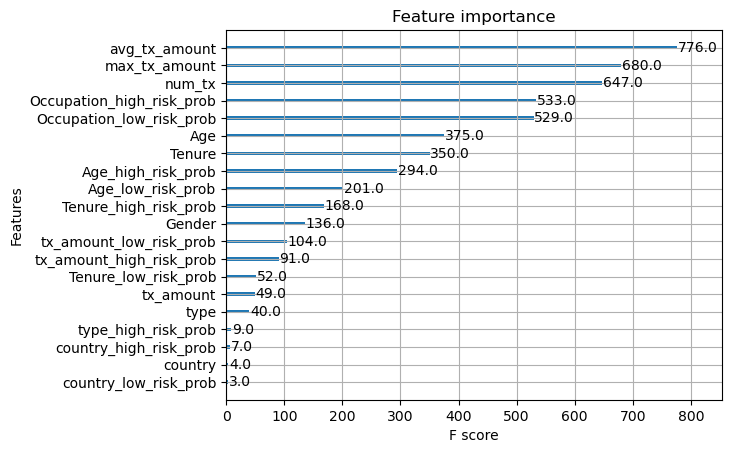

In [84]:
from xgboost import plot_importance
import matplotlib.pyplot as plt

# After your model is trained:
plot_importance(xgb_model, max_num_features=20)  # Change the number as needed
plt.show()

In [85]:
from sklearn.metrics import recall_score

# Assuming y_test are the true labels and y_pred are the predictions from the model
recall_label_1 = recall_score(y_test, y_pred, pos_label=1)
print(f'Recall for label 1: {recall_label_1}')

recall_label_0 = recall_score(y_test, y_pred, pos_label=0)
print(f'Recall for label 0: {recall_label_0}')

Recall for label 1: 0.9457963667089142
Recall for label 0: 0.9057549606370413


In [86]:
y_df = pd.DataFrame({'true_label': y_test, 'predicted_label': y_pred})

# convert the predicted label to a string ("High", "Low")
y_df['predicted_label'] = y_df['predicted_label'].apply(lambda x: 'High' if x == 1 else 'Low')
y_df['true_label'] = y_df['true_label'].apply(lambda x: 'High' if x == 1 else 'Low')

y_df

,true_label,predicted_label
828258,Low,Low
339137,Low,Low
447402,Low,Low
885484,Low,High
739933,Low,Low
...,...,...
809767,Low,Low
823074,High,Low
491405,Low,Low
184872,Low,Low


In [87]:
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=y_df['true_label'],
    name='True Label'
))
fig.add_trace(go.Histogram(
    x=y_df['predicted_label'],
    name='Predicted Label'
))

fig.update_layout(
    title='Distribution of True and Predicted Labels',
    xaxis_title='Label',
    yaxis_title='Count'
)

fig.show()

## SVM

In [1]:
import pandas as pd
import numpy as np

import plotly.graph_objects as go
import plotly.express as px

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.utils.class_weight import compute_class_weight, compute_sample_weight
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, confusion_matrix

In [2]:
ff_df = pd.read_parquet('../data/raw/ff_df.parquet')

In [8]:
ff_df.head(10)

,cust_id,tx_amount,type,trxn_id,tx_type,tx_message,direction,country,Name,Gender,...,Name_high_risk_prob,Name_low_risk_prob,Gender_high_risk_prob,Gender_low_risk_prob,Tenure_high_risk_prob,Tenure_low_risk_prob,Age_high_risk_prob,Age_low_risk_prob,Occupation_high_risk_prob,Occupation_low_risk_prob
0,CUST69827909,2330.0,deposit,XFMC87396884,cash,None,None,None,THERESA JACOBS,female,...,0.000000,0.000008,0.457392,0.450963,0.033215,0.051390,0.008996,0.003137,0.026555,0.010897
1,CUST78509707,4800.0,deposit,BFMG48785876,cash,None,None,None,LUCY-OCÉANE VINCENT,female,...,0.000000,0.000012,0.457392,0.450963,0.108784,0.165012,0.028205,0.036114,0.016857,0.027525
2,CUST71480951,6510.0,withdrawal,TIAX63158064,cash,None,None,None,PRISHA BALAN,male,...,0.000000,0.000020,0.445714,0.449374,0.043378,0.060095,0.024253,0.034879,0.035424,0.016262
3,CUST70854140,1715.0,deposit,IVIV63658514,cash,None,None,None,CHENG HONG XIA,male,...,0.000000,0.000021,0.445714,0.449374,0.046526,0.063595,0.037886,0.036821,0.035424,0.016262
4,CUST57406487,3770.0,withdrawal,TCBO25660159,cash,None,None,None,MIKE HANSON,other,...,0.000000,0.000002,0.096894,0.099663,0.050309,0.055822,0.026902,0.038541,0.000677,0.005578
5,CUST83072236,7420.0,withdrawal,FUKV94845036,cash,None,None,None,BILLY ANDRADE,male,...,0.000305,0.000000,0.445714,0.449374,0.033520,0.015953,0.031734,0.019027,0.018084,0.002733
6,CUST65245771,9185.0,deposit,KCMS97220854,cash,None,None,None,JOSHUA REESE,male,...,0.000000,0.000018,0.445714,0.449374,0.050309,0.055822,0.033283,0.017964,0.009326,0.001817
7,CUST47226069,4290.0,deposit,GUPU67927850,cash,None,None,None,JENNIFER RANDALL,female,...,0.000000,0.000031,0.457392,0.450963,0.048989,0.063314,0.033283,0.017964,0.013320,0.018786
8,CUST88567415,4910.0,deposit,ZWIW87899000,cash,None,None,None,MARIE JONES,female,...,0.000000,0.000015,0.457392,0.450963,0.048583,0.049057,0.032851,0.033017,0.011509,0.014825
9,CUST97657418,3005.0,withdrawal,DYVN84512683,cash,None,None,None,JAVIER CLARK,male,...,0.000000,0.000015,0.445714,0.449374,0.015351,0.006805,0.028078,0.015587,0.022095,0.025263


In [15]:
pos_prob = ff_df['label'].sum() / len(ff_df['label'])
neg_prob = 1 - pos_prob

male_pos = ff_df.query("Gender == 'male'").iloc[0].loc['Gender_high_risk_prob']
male_neg = ff_df.query("Gender == 'male'").iloc[0].loc['Gender_low_risk_prob']

total_male = pos_prob*male_pos + neg_prob*male_neg

female_pos = ff_df.query("Gender == 'female'").iloc[0].loc['Gender_high_risk_prob']
female_neg = ff_df.query("Gender == 'female'").iloc[0].loc['Gender_low_risk_prob']

total_female = pos_prob*female_pos + neg_prob*female_neg

other_pos = ff_df.query("Gender == 'other'").iloc[0].loc['Gender_high_risk_prob']
other_neg = ff_df.query("Gender == 'other'").iloc[0].loc['Gender_low_risk_prob']

total_other = pos_prob*other_pos + neg_prob*other_neg

print(total_male, total_female, total_other, total_male+total_female+total_other)

0.44894298973645774 0.45172047673879556 0.09933653352474667 1.0


In [3]:
# df = ff_df.drop(columns=['cust_id', 'trxn_id', 'Name', 'tx_message', 'Occupation']).copy()
df = ff_df.drop(columns=['cust_id', 'trxn_id', 'Name', 'tx_message', 'Occupation', 'Name_low_risk_prob', 'Name_high_risk_prob']).sample(10000).copy()

# Identify object-type columns
categorical_cols = df.select_dtypes(include=['object']).columns
label_encoders = {}

# Apply Label Encoding to each categorical column
for col in categorical_cols:
    # if col not in ['tx_message', 'cust_id', 'trxn_id', 'Name']:  # Exclude non-feature columns
    df[col] = LabelEncoder().fit_transform(df[col].astype(str))

df = df.replace(np.nan, 0)

df

,tx_amount,type,tx_type,direction,country,Gender,Age,Tenure,label,has_message,...,country_high_risk_prob,country_low_risk_prob,Gender_high_risk_prob,Gender_low_risk_prob,Tenure_high_risk_prob,Tenure_low_risk_prob,Age_high_risk_prob,Age_low_risk_prob,Occupation_high_risk_prob,Occupation_low_risk_prob
793626,342.0,0,1,1,6,0,35.0,1.0,0,False,...,0.000000,0.000000,0.457392,0.450963,0.033215,0.051390,0.032978,0.038281,0.000525,0.002471
719505,8.5,0,1,1,6,1,18.0,0.0,0,True,...,0.000000,0.000000,0.445714,0.449374,0.108784,0.165012,0.020115,0.035116,0.026411,0.011848
976577,4745.0,0,2,1,1,0,49.0,10.0,0,False,...,0.864802,0.719859,0.457392,0.450963,0.040442,0.044943,0.033283,0.017964,0.019887,0.024039
333279,170.0,0,1,2,6,1,27.0,0.0,0,False,...,0.000000,0.000000,0.445714,0.449374,0.108784,0.165012,0.015342,0.026270,0.000186,0.002601
182123,7605.0,1,0,0,6,1,37.0,5.0,0,False,...,0.000000,0.000000,0.445714,0.449374,0.050910,0.064522,0.031429,0.037817,0.016857,0.027525
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
872144,145.0,0,1,1,6,1,44.0,9.0,0,False,...,0.000000,0.000000,0.445714,0.449374,0.048583,0.049057,0.033824,0.027508,0.000406,0.001908
524092,12.0,0,1,2,6,2,42.0,10.0,0,False,...,0.000000,0.000000,0.096894,0.099663,0.040442,0.044943,0.033443,0.030282,0.016434,0.018960
625900,190.0,0,1,1,6,1,22.0,0.0,0,False,...,0.000000,0.000000,0.445714,0.449374,0.108784,0.165012,0.007472,0.014821,0.000440,0.004129
544062,40.0,0,1,1,6,0,56.0,12.0,0,False,...,0.000000,0.000000,0.457392,0.450963,0.040916,0.034530,0.015689,0.007972,0.000677,0.005578


In [13]:
# Separate the features and the target variable
X = df.drop('label', axis=1)  # Drop the label column to create the feature set
y = df['label']  # Use the label column as the target variable

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

class_weights = compute_class_weight('balanced', classes=y.unique(), y=y_train)
class_weight_dict = dict(enumerate(class_weights))
print(f"{class_weights}\n{class_weight_dict}")

[0.56377731 4.4198895 ]
{0: 0.5637773079633545, 1: 4.419889502762431}


In [14]:
kernel = 'linear'

svm = SVC(kernel=kernel, probability=True, class_weight=class_weight_dict).fit(X_train, y_train)

# In sample
pred = svm.predict(X_train)
prob = svm.predict_proba(X_train)[:,-1]

# pred = svm.predict(el)
# prob = svm.predict_proba(el)[:,-1]
# true = lY[i]
# cm = confusion_matrix(true, pred)
# acc = cm.diagonal().sum()/cm.sum().sum()
# sensitivity = cm[0,0]/cm.sum(axis=0)[0]
# specificity = cm[1,1]/cm.sum(axis=0)[1]
# report = metrics.classification_report(true, pred, output_dict=True)
# report_df = pd.DataFrame({k: report[k] for k in ('0', '1')})
# fpr, tpr, thresholds = metrics.roc_curve(true, prob)
# l_roc.append(pd.DataFrame({'fpr': fpr, 'tpr': tpr, 'type':types[i]}))
# precision, recall, thresholds = metrics.precision_recall_curve(true, prob)
# l_recall.append(pd.DataFrame({'precision': precision, 'recall': recall, 'type':types[i]}))
# print(f"{types[i]}: \n Accuracy: {acc:.2%}\n Sensitivity: {sensitivity:.2%}\n Specificity: {specificity:.2%}\n")
# print(report_df.to_latex())

# df_roc = pd.concat(l_roc)
# df_recall = pd.concat(l_recall)

In [ ]:
recall_label_1 = recall_score(y_test, pred, pos_label=1)
print(f'In-Sample recall for label 1: {recall_label_1}')

recall_label_0 = recall_score(y_test, pred, pos_label=0)
print(f'In-Sample recall for label 0: {recall_label_0}')

print(prob)

In [ ]:
# Out of sample
pred = svm.predict(X_test)
prob = svm.predict_proba(X_test)[:,-1]

In [ ]:
recall_label_1 = recall_score(y_test, pred, pos_label=1)
print(f'Out-of-Sample recall for label 1: {recall_label_1}')

recall_label_0 = recall_score(y_test, pred, pos_label=0)
print(f'Out-of-Sample recall for label 0: {recall_label_0}')